In [1]:
using NBInclude
@nbinclude("../../Flinch_chains/chain_analysis/diffSHT_healpix.ipynb")
@nbinclude("../../Flinch_chains/chain_analysis/utilities.ipynb")

In [2]:
using Distributions
using Plots
using StatsPlots
using LinearAlgebra
using Random
using LaTeXStrings
using StatsBase
using StatsFuns
using CSV, DataFrames
using NPZ
using Healpix

In [3]:
Random.seed!(1123)

TaskLocalRNG()

In [4]:
pyplot()

Plots.PyPlotBackend()

In [12]:
mask_512 = readMapFromFITS("wmap_temperature_kq85_analysis_mask_r9_9yr_v5.fits",2,Float64)
mask_nside = udgrade(nest2ring(mask_512), nside)
for i in 1:length(mask_nside.pixels)
    if mask_nside.pixels[i]<=0.5
        mask_nside.pixels[i]=1
    else
        mask_nside.pixels[i]=0
    end
end

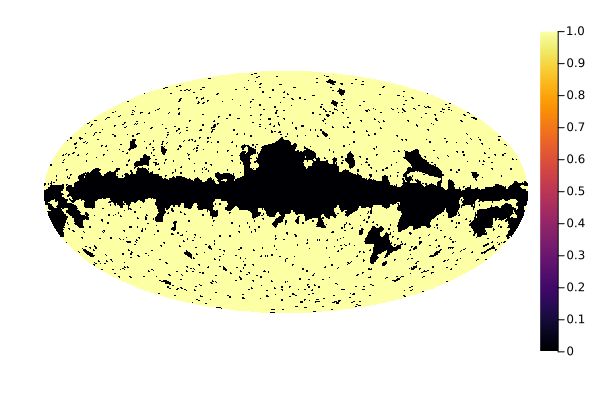

In [15]:
plot(mask_512)

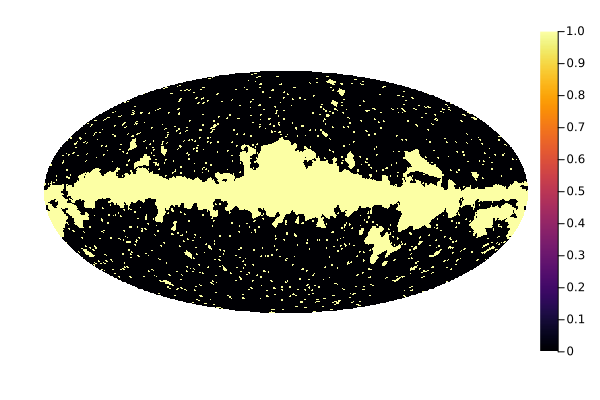

In [13]:
plot(mask_nside)

In [14]:
ϵ=100
N = ϵ*ones(nside2npix(256))
N[mask_nside.==1] .= 5*10^4;

In [31]:
invN_HMap = HealpixMap{Float64,RingOrder}(1 ./ N);

In [32]:
(length(invN_HMap[invN_HMap.<=2e-5]), length(N[invN_HMap.<=2e-5]))

(201189, 201189)

In [11]:
f = sum(mask_nside)/length(mask_nside)

0.7441749572753906

In [49]:
f = mean(mask_512*mask_512)

0.7480608622233073

In [4]:
function Cl2Kl(Cl)
    C̃ = Cl./1_500
    return norminvcdf.(0,1,C̃)
end

function Kl2Cl(Kl)
    return 1_500 .* normcdf.(0,1,Kl)
end

@adjoint function Kl2Cl(Kl)
    
    y = Kl2Cl(Kl)
    
    function Kl2Cl_PB(ȳ)
        x̄ = 1_500 .* pdf.(Normal(0,1), Kl) .* ȳ
        return (x̄,)
    end
    return y, Kl2Cl_PB
end     

In [5]:
nside=256
lmax=2nside-1

511

In [6]:
realiz_Dl = CSV.read("Capse_fiducial_Dl.csv", DataFrame)[1:lmax-1,1]
realiz_Cl = dl2cl(realiz_Dl, 2)
realiz_Cl[1] += 1e-10
realiz_Cl[2] += 1e-10
realiz_map = synfast(realiz_Cl, nside);

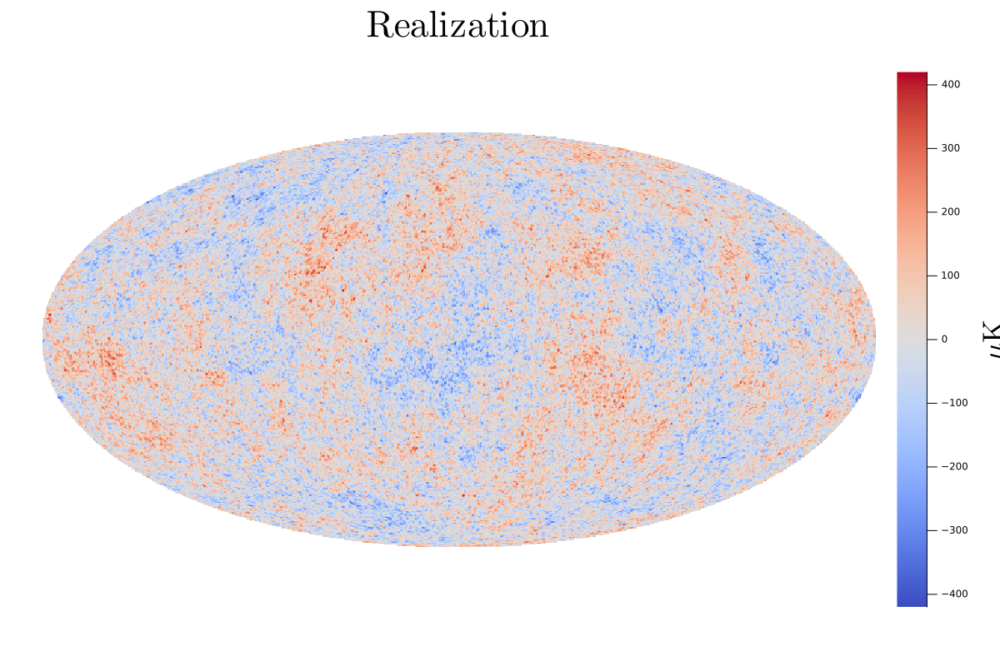

In [7]:
plot(realiz_map, size=(1200,800), color=:coolwarm, title=L"\mathrm{Realization}", colorbar_title=L"\mathrm{\mu K}", clim=(-420,420),
        titlefontsize=30, colorbar_titlefontsize=24, colorbar_tickfontsize=16)

In [42]:
realiz_map[invN_HMap.>2e-5].=0;

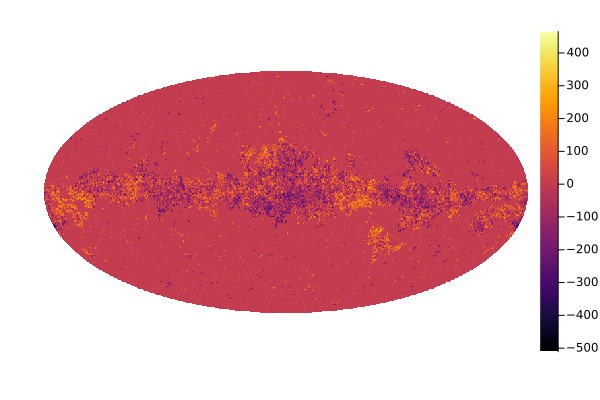

In [43]:
plot(realiz_map)

## MASKED

In [8]:
function x_vec2vecmat(vec_x, lmax::Int64, nbin::Int64)
    
    all_x_per_field = reshape(vec_x, ( nbin, 2*numberOfAlms(lmax)-(lmax+1)))
    x = Vector{Matrix{Float64}}(undef, lmax+1)
    for l in 0:lmax
        j_in = l^2 + 1
        j_fin = j_in + 2*l
        x[l+1] = all_x_per_field[:,j_in:j_fin]
    end

    return x
end
function from_alm_to_healpix_alm(alm, l_max, nbin)

    Alms = []
    for i in 1:nbin
        alm_array = zeros(ComplexF64, numberOfAlms(l_max))
        for l in 1:l_max+1
            alm_array[l] = alm[l][i, 1]
        end
        j = l_max + 1
        for m in 2:2:(2*l_max + 1)
            for l in (Int(m/2) +1):(l_max+1)
                j += 1
                alm_array[j] = alm[l][i,m] + alm[l][i,m+1]*im
            end
        end
        push!(Alms, Alm(l_max, l_max, alm_array))
    end

    return Alms
end

from_alm_to_healpix_alm (generic function with 1 method)

In [79]:
alm = x_vec2vecmat(vec(PF_chain_2[1:end-lmax-1,1]), lmax, 1)
map = alm2map(from_alm_to_healpix_alm(alm, lmax, 1)[1], nside);

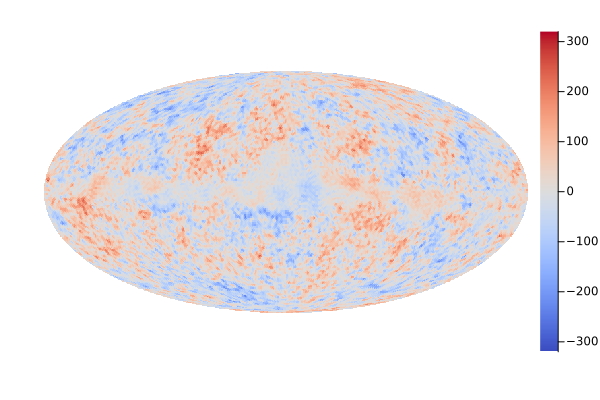

In [80]:
plot(map, color=:coolwarm, clim=(-320,320))

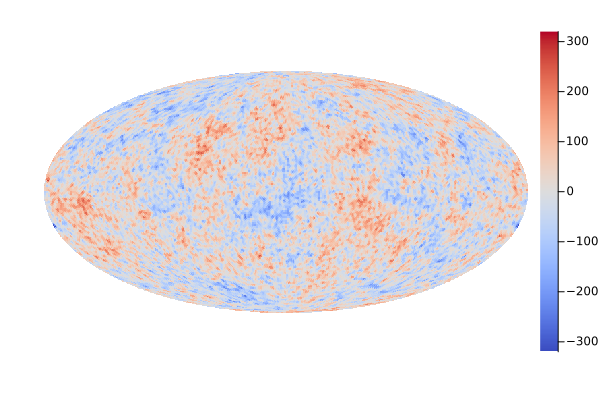

In [26]:
plot(realiz_map, color=:coolwarm, clim=(-320,320))

In [70]:
PF_chain_2 = npzread("MPI_chains/UX9Bd_PATHinit_64.npy")

16512×10 Matrix{Float64}:
   8.10504     8.14762     8.1165    …    8.14806     8.12461     8.13816
   0.995816    1.00926     1.00276        1.01078     0.981762    0.996422
  -4.92601    -4.9279     -4.91591       -4.95995    -4.92338    -4.92425
  -2.85354    -2.84716    -2.88707       -2.87953    -2.86278    -2.85011
 -19.7262    -19.7257    -19.7445       -19.7353    -19.7242    -19.7288
 -17.5151    -17.5436    -17.5255    …  -17.5377    -17.5448    -17.5196
   0.785184    0.787373    0.785524       0.817841    0.803559    0.775146
  -4.60791    -4.6074     -4.60918       -4.58765    -4.62889    -4.59556
  12.5286     12.5468     12.5202        12.5129     12.5339     12.5538
  12.1861     12.195      12.189         12.1913     12.1951     12.18
   ⋮                                 ⋱                          
  -3.12373    -3.15235    -3.14153       -3.1437     -3.16182    -3.17541
  -3.107      -3.07822    -3.11356       -3.10573    -3.09428    -3.11113
  -3.10115    -3.0987    

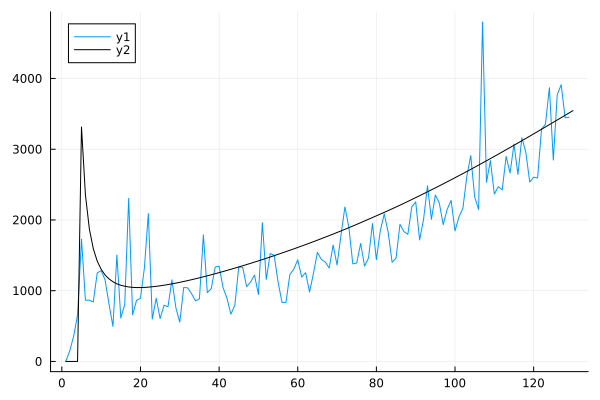

In [71]:
plot(cl2dl(Kl2Cl(PF_chain_2[end-lmax-1:end,end]), 0))
plot!(cl2dl(realiz_Cl, 2), color="black")

In [9]:
HMC_chain = npzread("../../myChains/LzLvD_mask_HMC_nside_$(nside).npy")
#NUTS_chain = npzread("../../myChains/mask_NUTS_nside_$(nside).npy")
#MCHMC_chain = npzread("../../myChains/mask_MCHMC_nside_$(nside).npy")[:,1:5:end];

262656×1000 Matrix{Float64}:
   1.40049       1.40141       1.40174     …    1.41843       1.41634
  -1.01907      -1.0192       -1.01946         -1.04796      -1.0473
   0.00597963    0.00940533    0.00988291      -0.00872105   -0.00721864
  -1.48937      -1.48798      -1.49164         -1.44444      -1.44933
 -13.1624      -13.1645      -13.1676         -13.1614      -13.1607
 -15.5516      -15.5535      -15.5516      …  -15.5623      -15.5634
   0.928887      0.929687      0.931035         0.933857      0.929509
  -3.11809      -3.11903      -3.12392         -3.13091      -3.13225
  12.266        12.2612       12.256           12.3517       12.3527
  16.442        16.4418       16.4449          16.5014       16.5033
   ⋮                                       ⋱                
  -3.95299      -3.95177      -3.95047         -3.96626      -3.96403
  -3.95057      -3.95009      -3.95005         -3.97681      -3.97774
  -3.96846      -3.96882      -3.96795         -3.94595      -3.9463
  

In [12]:
HMC_EssRhat = npzread("../../myChains/LzLvD_mask_HMC_EssRhat_nside_$(nside).npy")
#NUTS_EssRhat = npzread("../../myChains/mask_NUTS_EssRhat_nside_$(nside).npy")
#MCHMC_EssRhat = npzread("../../myChains/mask_MCHMC_EssRhat_nside_$(nside).npy");

262656×2 Matrix{Float64}:
 2.66247  2.0507
 2.77029  1.81432
 6.93454  1.02458
 4.35016  1.29406
 3.27643  1.48493
 3.16619  1.63706
 7.64787  1.07693
 3.77725  1.42079
 5.83734  1.12178
 2.44534  2.07454
 ⋮        
 2.74997  1.8573
 3.1219   1.60312
 2.54639  2.07844
 9.69979  1.15747
 3.72869  1.34024
 8.02709  1.17503
 7.81456  1.12097
 5.78933  1.14932
 2.79181  1.88753

In [13]:
HMC_stats = npzread("../../myChains/LzLvD_mask_HMC_stats_nside_$(nside).npy")
#NUTS_stats = npzread("../../myChains/mask_NUTS_stats_nside_$(nside).npy");

1000×2 Matrix{Float64}:
 -97699.1       2.28862e5
 -98363.0       2.29116e5
 -97954.8  230127.0
 -97755.0       2.29093e5
 -98084.9       2.29013e5
 -98523.8       2.29904e5
 -98651.4  230123.0
 -98266.1       2.29703e5
 -98266.1       2.29825e5
 -98266.1  228830.0
      ⋮    
 -98310.5       2.29679e5
 -97886.2       2.29686e5
 -97677.4       2.28673e5
 -97669.1       2.29169e5
 -97669.1       2.29065e5
 -98131.7  228428.0
 -97951.5       2.29317e5
 -98408.9       2.29502e5
 -98513.8       2.29802e5

In [14]:
HMC_SumPerf = npzread("../../myChains/LzLvD_mask_HMC_SumPerf_nside_$(nside).npy")
#NUTS_SumPerf = npzread("../../myChains/mask_NUTS_SumPerf_nside_$(nside).npy")
#MCHMC_SumPerf = npzread("../../myChains/mask_MCHMC_SumPerf_nside_$(nside).npy");

1×3 Matrix{Float64}:
 14616.7  6.02401  1.34625

In [12]:
HMC_SumPerf

1×3 Matrix{Float64}:
 1984.5  6.43481  1.28686

In [17]:
NUTS_SumPerf

1×3 Matrix{Float64}:
 8510.3  414.448  1.0015

In [18]:
MCHMC_SumPerf

1×3 Matrix{Float64}:
 164.186  49.5733  1.024

### Performances

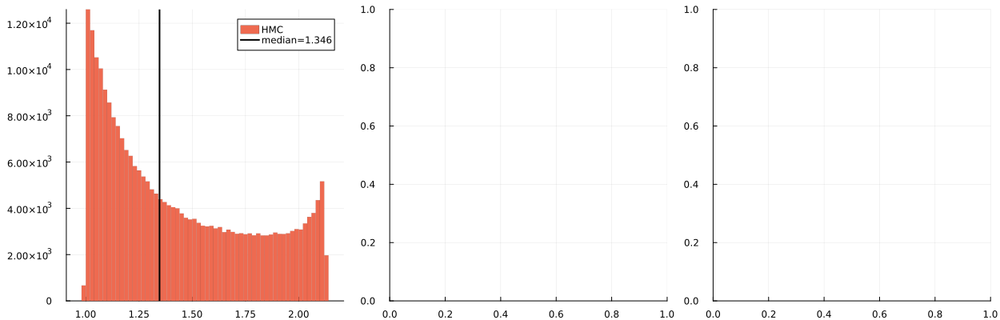

In [23]:
p = plot(layout=(1,3), size=(1250,400))
histogram!(p, HMC_EssRhat[:,2], color="coral2", label="HMC", lw=0, subplot=1)
vline!(p, [median(HMC_EssRhat[:,2])], color="black", label="median="*string(round(median(HMC_EssRhat[:,2]),digits=3)), lw=2, subplot=1)
#histogram!(p, NUTS_EssRhat[:,2], color="blue2", label="NUTS", lw=0, subplot=2)
#vline!(p, [median(NUTS_EssRhat[:,2])], color="black", label="median="*string(round(median(NUTS_EssRhat[:,2]),digits=4)), lw=2, subplot=2)
#histogram!(p, MCHMC_EssRhat[1:end-3,2], color="goldenrod2", label="MCHMC", lw=0, subplot=3)
#vline!(p, [median(MCHMC_EssRhat[1:end-3,2])], color="black", label="median="*string(round(median(MCHMC_EssRhat[1:end-3,2]),digits=3)), lw=2, subplot=3)

In [20]:
HMC_t = HMC_SumPerf[1]
NUTS_t = NUTS_SumPerf[1]
MCHMC_t = MCHMC_SumPerf[1];

In [21]:
println("HMC: ess/s = ", string(round(mean(HMC_EssRhat[:,1])/HMC_t, digits=3)), "\n",
    "NUTS: ess/s = ", string(round(mean(NUTS_EssRhat[:,1])/NUTS_t, digits=3)),  "\n",
    "MCHMC: ess/s = ", string(round(mean(MCHMC_EssRhat[1:end-3,1])/MCHMC_t, digits=3)))

HMC: ess/s = 0.004
NUTS: ess/s = 0.049
MCHMC: ess/s = 0.298


In [22]:
HMC_grads = 1_000*50
NUTS_grads = sum(2 .^ NUTS_stats[2001:3000])
MCHMC_grads = 10_000;

In [24]:
println("HMC: ess/grad_evals = ", string(round(mean(HMC_EssRhat[:,1])/HMC_grads, digits=4)), "\n",
    "NUTS: ess/grad_evals = ", string(round(mean(NUTS_EssRhat[:,1])/NUTS_grads, digits=4)),  "\n",
    "MCHMC: ess/grad_evals = ", string(round(mean(MCHMC_EssRhat[1:end-3,1])/MCHMC_grads, digits=4)))

HMC: ess/grad_evals = 0.0001
NUTS: ess/grad_evals = 0.0004
MCHMC: ess/grad_evals = 0.0049


In [25]:
println("HMC: corr length = ", string(round(1_000/mean(HMC_EssRhat[:,1]), digits=4)), "\n",
    "NUTS: corr length = ", string(round(1_000/mean(NUTS_EssRhat[:,1]), digits=4)),  "\n",
    "MCHMC: corr length = ", string(round(5_000/mean(MCHMC_EssRhat[1:end-3,1]), digits=4)))

HMC: corr length = 143.1243
NUTS: corr length = 2.4128
MCHMC: corr length = 102.1963


### Reconstruction

In [24]:
HMC_alm = x_vec2vecmat(vec(mean(HMC_chain[1:end-lmax-1,:], dims=2)), lmax, 1)
HMC_map = alm2map(from_alm_to_healpix_alm(HMC_alm, lmax, 1)[1], nside);

In [27]:
NUTS_alm = x_vec2vecmat(vec(mean(NUTS_chain[1:end-lmax-1,:], dims=2)), lmax, 1)
NUTS_map = alm2map(from_alm_to_healpix_alm(NUTS_alm, lmax, 1)[1], nside);

In [28]:
MCHMC_alm = x_vec2vecmat(vec(mean(MCHMC_chain[1:end-lmax-4,:], dims=2)), lmax, 1)
MCHMC_map = alm2map(from_alm_to_healpix_alm(MCHMC_alm, lmax, 1)[1], nside);

In [35]:
HMC_alm, HMC_map = 0, 0
NUTS_alm, NUTS_map = 0, 0
MCHMC_alm, MCHMC_map = 0, 0

(0, 0)

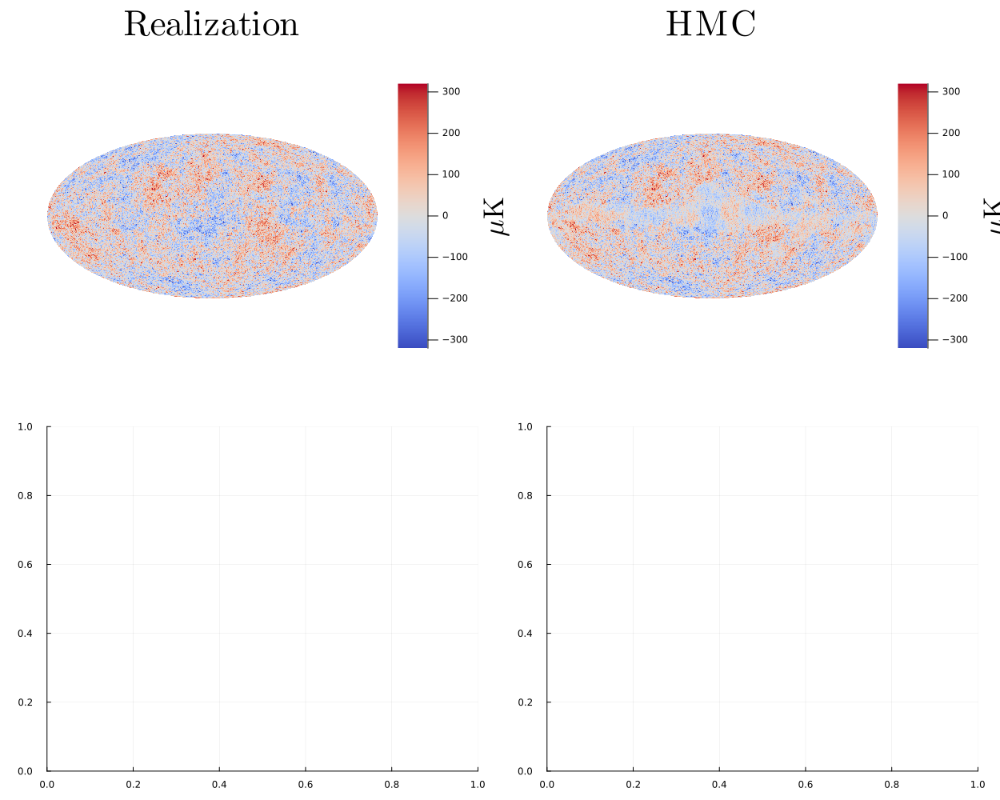

In [25]:
p = plot(layout=(2,2), size=(1250,1000))
plot!(p, realiz_map, color=:coolwarm, title=L"\mathrm{Realization}", colorbar_title=L"\mathrm{\mu K}", clim=(-320, 320),
        titlefontsize=30, colorbar_titlefontsize=24, colorbar_tickfontsize=16, subplot=1)
plot!(p, HMC_map, color=:coolwarm, title=L"\mathrm{HMC}", colorbar_title=L"\mathrm{\mu K}", clim=(-320, 320),
        titlefontsize=30, colorbar_titlefontsize=24, colorbar_tickfontsize=16, subplot=2)
#plot!(p, NUTS_map, color=:coolwarm, title=L"\mathrm{NUTS}", colorbar_title=L"\mathrm{\mu K}", clim=(-320, 320),
 #       titlefontsize=30, colorbar_titlefontsize=24, colorbar_tickfontsize=16, subplot=3)
#plot!(p, MCHMC_map, color=:coolwarm, title=L"\mathrm{MCHMC}", colorbar_title=L"\mathrm{\mu K}", clim=(-320, 320),
 #       titlefontsize=30, colorbar_titlefontsize=24, colorbar_tickfontsize=16, subplot=4)

In [31]:
HMC_maps_vec = Vector(undef, 1_000)
for i in 1:1_000
    HMC_alm_i = x_vec2vecmat(vec(HMC_chain[1:end-lmax-1,i]), lmax, 1)
    HMC_maps_vec[i] = deepcopy(alm2map(from_alm_to_healpix_alm(HMC_alm_i, lmax, 1)[1], nside))
end

In [32]:
NUTS_maps_vec = Vector(undef, 1_000)
for i in 1:1_000
    NUTS_alm_i = x_vec2vecmat(vec(NUTS_chain[1:end-lmax-1,i]), lmax, 1)
    NUTS_maps_vec[i] = deepcopy(alm2map(from_alm_to_healpix_alm(NUTS_alm_i, lmax, 1)[1], nside))
end

In [33]:
MCHMC_maps_vec = Vector(undef, 1_000)
for i in 1:1_000
    MCHMC_alm_i = x_vec2vecmat(vec(MCHMC_chain[1:end-lmax-4,i]), lmax, 1)
    MCHMC_maps_vec[i] = deepcopy(alm2map(from_alm_to_healpix_alm(MCHMC_alm_i, lmax, 1)[1], nside))
end

In [27]:
HMC_maps_vec = 0
NUTS_maps_vec = 0
MCHMC_maps_vec = 0

0

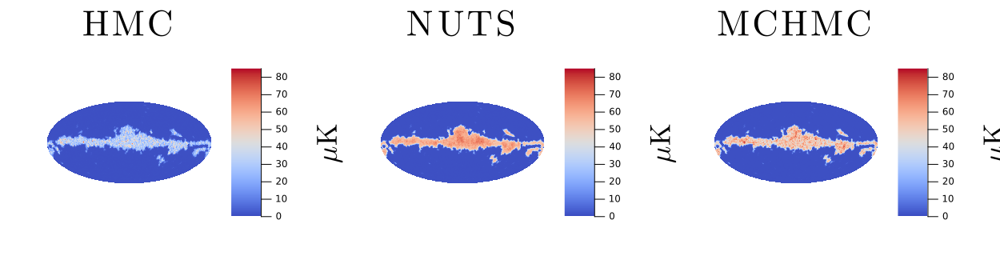

In [34]:
p = plot(layout=(1,3), size=(1250,350))
plot!(p, HealpixMap{Float64,RingOrder,Array{Float64,1}}(std(HMC_maps_vec)), color=:coolwarm, title=L"\mathrm{HMC}", colorbar_title=L"\mathrm{\mu K}",
        titlefontsize=30, colorbar_titlefontsize=24, colorbar_tickfontsize=16, subplot=1, clim=(0,85))
plot!(p, HealpixMap{Float64,RingOrder,Array{Float64,1}}(std(NUTS_maps_vec)), color=:coolwarm, title=L"\mathrm{NUTS}", colorbar_title=L"\mathrm{\mu K}",
        titlefontsize=30, colorbar_titlefontsize=24, colorbar_tickfontsize=16, subplot=2, clim=(0,85))
plot!(p, HealpixMap{Float64,RingOrder,Array{Float64,1}}(std(MCHMC_maps_vec)), color=:coolwarm, title=L"\mathrm{MCHMC}", colorbar_title=L"\mathrm{\mu K}",
        titlefontsize=30, colorbar_titlefontsize=24, colorbar_tickfontsize=16, subplot=3, clim=(0,85))

In [35]:
HMC_Δ = HealpixMap{Float64,RingOrder,Array{Float64,1}}((HMC_map.pixels-realiz_map.pixels)./std(HMC_maps_vec))
NUTS_Δ = HealpixMap{Float64,RingOrder,Array{Float64,1}}((NUTS_map.pixels-realiz_map.pixels)./std(NUTS_maps_vec))
MCHMC_Δ = HealpixMap{Float64,RingOrder,Array{Float64,1}}((MCHMC_map.pixels-realiz_map.pixels)./std(MCHMC_maps_vec));

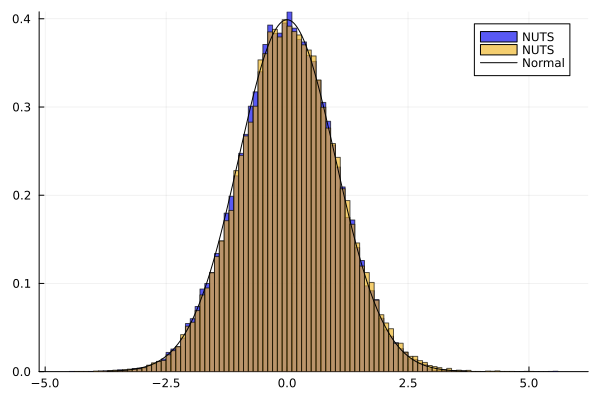

In [38]:
#histogram(HMC_Δ.pixels, color="coral2", label="HMC", normalize=:pdf)
histogram(NUTS_Δ.pixels, color="blue2", alpha=0.65, label="NUTS", normalize=:pdf)
histogram!(MCHMC_Δ.pixels, color="goldenrod2", alpha=0.65, label="NUTS", normalize=:pdf)
plot!(Normal(), color="black", label="Normal")

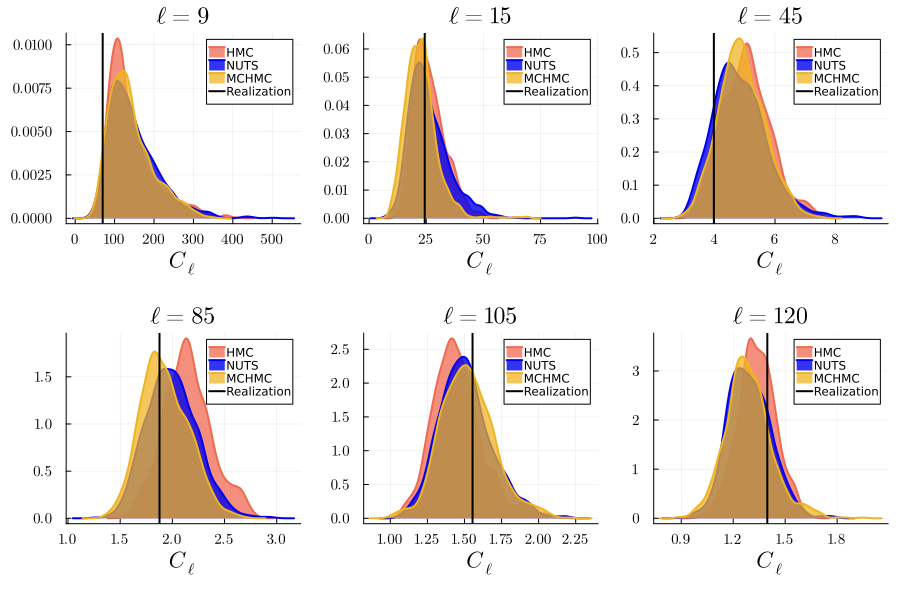

In [41]:
p = plot(layout=(2,3), size=(900,600),  xtickfontsize=10, ytickfontsize=10, xguidefontsize=15, yguidefontsize=15, 
    legend_font_pointsize=8, titlefontsize=16, xformatter=:latex, yformatter=:latex)

ℓs = [9, 15, 45, 85, 105, 120]

for i in 1:6

    density!(p, Kl2Cl(HMC_chain[end-lmax-1+ℓs[i],:]), color="coral2", lw=2, fillrange=0, fillalpha=0.75, label="HMC", subplot=i)
    density!(p, Kl2Cl(NUTS_chain[end-lmax-1+ℓs[i],:]), lw=2, fillrange=0, fillalpha=0.8, color="blue2", label="NUTS", subplot=i)
    density!(p, Kl2Cl(MCHMC_chain[end-lmax-4+ℓs[i],:]), color="goldenrod2", lw=2, fillrange=0, fillalpha=0.75, label="MCHMC", subplot=i)
    vline!(p, [realiz_Cl[ℓs[i]]], color="black", label="Realization", lw=2, title=L"\ell="*latexstring(ℓs[i]), xlabel=L"C_{\ell}", subplot=i, bottom_margin=7Plots.mm)
end
display(p)

In [42]:
HMC_Kl = vec(median(HMC_chain[end-lmax:end,:], dims=2))
HMC_σ_Kl = vec(std(HMC_chain[end-lmax:end,:], dims=2))
NUTS_Kl = vec(median(NUTS_chain[end-lmax:end,:], dims=2))
NUTS_σ_Kl = vec(std(NUTS_chain[end-lmax:end,:], dims=2))
MCHMC_Kl = vec(median(MCHMC_chain[end-lmax-3:end-3,:], dims=2))
MCHMC_σ_Kl = vec(std(MCHMC_chain[end-lmax-3:end-3,:], dims=2));

In [43]:
HMC_Cl = Kl2Cl(HMC_Kl)
HMC_σ_Cl = abs.(diag(jacobian(x->Kl2Cl(x), HMC_Kl)[1])).*HMC_σ_Kl
NUTS_Cl = Kl2Cl(NUTS_Kl)
NUTS_σ_Cl = abs.(diag(jacobian(x->Kl2Cl(x), NUTS_Kl)[1])).*NUTS_σ_Kl
MCHMC_Cl = Kl2Cl(MCHMC_Kl)
MCHMC_σ_Cl = abs.(diag(jacobian(x->Kl2Cl(x), MCHMC_Kl)[1])).*MCHMC_σ_Kl;

In [44]:
dl_c = [l*(l+1)/2π for l in 0:lmax];

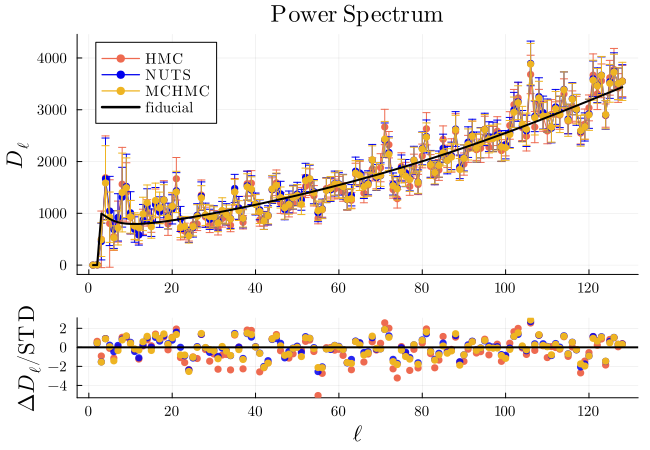

In [46]:
p = plot(layout=@layout([a;b{0.25h}]), plot_title=L"\mathrm{Power \ Spectrum}", xtickfontsize=10, ytickfontsize=10, xguidefontsize=15, yguidefontsize=15, 
    legend_font_pointsize=10, titlefontsize=16, size=(650,450), xformatter=:latex, yformatter=:latex)

plot!(p, cl2dl(HMC_Cl,0), color="coral2", label = L"\mathrm{HMC}", yerror=dl_c.*HMC_σ_Cl, markershape=:circle, markerstrokecolor="coral2", subplot=1)
plot!(p, cl2dl(NUTS_Cl,0), color="blue2", label = L"\mathrm{NUTS}", yerror=dl_c.*NUTS_σ_Cl, markershape=:circle, markerstrokecolor="blue2", subplot=1)
plot!(p, cl2dl(MCHMC_Cl,0), color="goldenrod2", label = L"\mathrm{MCHMC}", yerror=dl_c.*MCHMC_σ_Cl, markershape=:circle, markerstrokecolor="goldenrod2", subplot=1)
plot!(p, cl2dl(realiz_Cl,0), label = L"\mathrm{fiducial}", color="black", lw=2, ylabel=L"D_\ell", subplot=1, left_margin=2Plots.mm)
#plot!(p, cl2dl(gen_Cl,0), label=L"\mathrm{measured}", color="lightblue4", lw=2, subplot=1)

scatter!(p, (cl2dl(HMC_Cl,0).-(cl2dl(realiz_Cl,0)))./(dl_c.*HMC_σ_Cl), color="coral2", label = "", markershape=:circle, markerstrokecolor="coral2", subplot=2)
scatter!(p, (cl2dl(NUTS_Cl,0).-cl2dl(realiz_Cl,0))./(dl_c.*NUTS_σ_Cl), color="blue2", label = "", markershape=:circle, markerstrokecolor="blue2", subplot=2, alpha=0.85,
    xlabel=L"\ell", ylabel=L"\Delta D_\ell / \mathrm{STD}")#, bottom_margin=5Plots.mm, left_margin=5Plots.mm)
scatter!(p, (cl2dl(MCHMC_Cl,0).-(cl2dl(realiz_Cl,0)))./(dl_c.*MCHMC_σ_Cl), color="goldenrod2", label = "", markershape=:circle, markerstrokecolor="goldenrod2", subplot=2)
hline!([0], color="black", lw=2, subplot=2, label="")